In [1]:
import os, glob
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import pandas as pd
import anndata as ad
import tangram as tg

from sawg import SpotTable
from celltype_mapping import bin_gene_table, convert_to_anndata, TangramMapping

In [2]:
data_path = 'C://Users/stephanies/data/BGI_data'

In [4]:
human_NT_file = data_path + '/903TR_C4/SS200000903TR_C4.tissue.gem'
human_NT_table = SpotTable.load_stereoseq(human_NT_file, human_NT_file + '.npz')

Loading from npz..


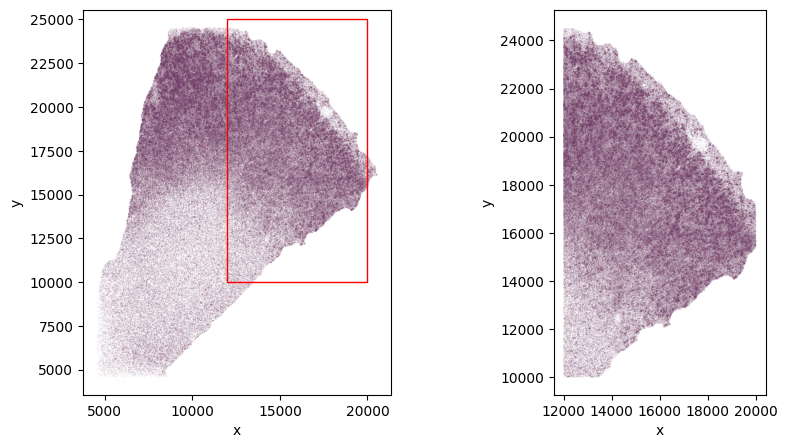

In [5]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

sub = human_NT_table.get_subregion(xlim=(12000, 20000), ylim=(10000, 25000))
human_NT_table[::100].scatter_plot(ax=ax[0], alpha=0.1, size=0.5)
sub.plot_rect(ax[0], 'r')
sub[::50].scatter_plot(ax=ax[1], alpha=0.1, size=0.5)

In [15]:
cbg_meta = pd.read_csv(data_path + '/903TR_C4/cell_metadata.csv')
cbg_meta.rename(columns={'Unnamed: 0': 'sample_id'}, inplace=True)
cbg_meta.set_index('sample_id', inplace=True)
cbg_meta.head()

,x,y,n_spots,n_transcripts,n_genes
sample_id,,,,,
1,5815.666504,4578.666504,6.0,3.0,3.0
6,4868.000000,4565.666504,5.0,3.0,3.0
9,5776.777832,4572.777832,12.0,9.0,7.0
10,7874.111328,4574.777832,13.0,9.0,9.0
11,5580.714355,4581.000000,8.0,7.0,6.0


In [44]:
_, ad_sp_bin50 = convert_to_anndata(sp_data=human_NT_table, binsize=50)

MemoryError: Unable to allocate 1.97 MiB for an array with shape (129363, 2) and data type float64

In [17]:
def cells_per_bin(row, binsize):
    x_bounds = (row['x'], row['x']+binsize)
    y_bounds = (row['y'], row['y']+binsize)

    return(len(cbg_meta[(cbg_meta['x'].between(x_bounds[0], x_bounds[1])) & (cbg_meta['y'].between(y_bounds[0], y_bounds[1]))]))

ad_sp_bin50.obs['n_cells'] = ad_sp_bin50.obs.apply(lambda x: cells_per_bin(x, 50), axis=1)

In [18]:
ad_sp_bin50.uns = {
    'chip': '903TR_C4',
    'binsize': '50',
    'species': 'Human NT',
    'region': 'MTG',
    'method': 'stereoseq'
}
ad_sp_bin50.write_h5ad(data_path + '/903TR_C4/ad_sp_bin50_2.h5ad')

In [16]:
ad_sp_bin100 = ad.read_h5ad(data_path + '/903TR_C4/ad_sp_bin100.h5ad')
ad_sp_bin100.obs

,x,y,n_transcripts,n_genes,n_cells
bin:4511_4569,4511.0,4569.0,12.0,12,3
bin:4511_4669,4511.0,4669.0,47.0,36,2
bin:4511_4769,4511.0,4769.0,90.0,61,0
bin:4511_4869,4511.0,4869.0,104.0,80,1
bin:4511_4969,4511.0,4969.0,113.0,92,3
...,...,...,...,...,...
bin:20411_16369,20411.0,16369.0,2074.0,1160,1
bin:20411_16469,20411.0,16469.0,1599.0,882,1
bin:20411_16569,20411.0,16569.0,409.0,238,0
bin:20511_16069,20511.0,16069.0,905.0,568,0


In [19]:
ad_sp_bin50.obs['binsize'] = '50'
ad_sp_bin100.obs['binsize'] = '100'
cbg_meta['binsize'] = 'cell'

In [20]:
obs_data = ad_sp_bin100.obs.append(ad_sp_bin50.obs)
obs_data = obs_data.append(cbg_meta)
obs_data.head()

,x,y,n_transcripts,n_genes,n_cells,binsize,n_spots
bin:4511_4569,4511.0,4569.0,12.0,12.0,3.0,100,NaN
bin:4511_4669,4511.0,4669.0,47.0,36.0,2.0,100,NaN
bin:4511_4769,4511.0,4769.0,90.0,61.0,0.0,100,NaN
bin:4511_4869,4511.0,4869.0,104.0,80.0,1.0,100,NaN
bin:4511_4969,4511.0,4969.0,113.0,92.0,3.0,100,NaN


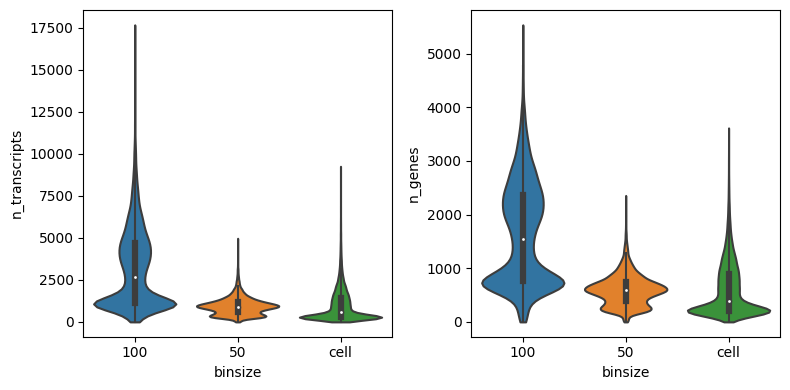

In [21]:
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
sns.violinplot(data=obs_data, x='binsize', y='n_transcripts', ax=ax[0], cut=0, scale='width')
sns.violinplot(data=obs_data, x='binsize', y='n_genes', ax=ax[1], cut=0, scale='width')
plt.tight_layout()

<AxesSubplot: xlabel='binsize', ylabel='n_spots'>

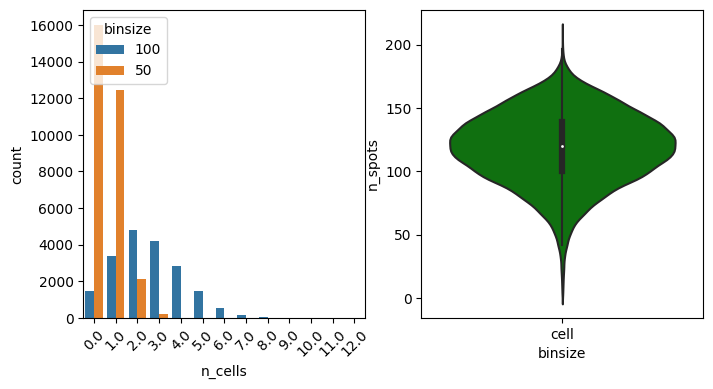

In [32]:
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
sns.countplot(data=obs_data[obs_data['binsize'].isin(['50', '100'])], x='n_cells', hue='binsize', 
                                                     ax=ax[0])
ax[0].tick_params(axis='x', labelrotation=45)
sns.violinplot(data=obs_data[obs_data['binsize']=='cell'], x='binsize', y='n_spots', ax=ax[1], color='green')
# ax[1].axhline(100*100, color='blue', ls='--')
# ax[1].axhline(50*50, color='orange', ls='--')
# ax[1].set_yscale('symlog')

Map binned data with Tangram using same marker gene set as with cells. Add deconvolution after

In [33]:
tg_map_bin50 = TangramMapping(
    sp_data = data_path + '/903TR_C4/ad_sp_bin50_2.h5ad',
    sc_data = 'C://Users/stephanies/data/human/ad_sc_human_MTG_great_ape.h5ad',
    meta = {
        'stereoseq UID': '903TR_C4'
    }
)

In [34]:
training_genes = pd.read_csv(data_path + '/903TR_C4/training_genes.csv', header=None)[0].to_list()

In [35]:
tg_map_bin50.set_training_genes(training_genes, meta={'training_genes': 'cluster ROC marker genes above median'})

starting with 4620 training genes..


INFO:root:4619 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:18450 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.


In [21]:
ad_sp_marker_genes = tg_map_bin100.ad_sp[:, tg_map_bin100.ad_sc.uns['training_genes']]
tg_map_bin100.ad_sp.obs['n_tg_transcripts'] = np.array(ad_sp_marker_genes.X.sum(axis=1))
tg_map_bin100.ad_sp.obs['n_tg_genes'] = np.array(np.count_nonzero(ad_sp_marker_genes.X, axis=1))
tg_map_bin100.ad_sp.obs

,x,y,n_transcripts,n_genes,n_cells,uniform_density,rna_count_based_density,n_tg_transcripts,n_tg_genes
bin:4511_4569,4511.0,4569.0,12.0,12,3,0.000053,2.005026e-07,5.0,5
bin:4511_4669,4511.0,4669.0,47.0,36,2,0.000053,7.853019e-07,35.0,25
bin:4511_4769,4511.0,4769.0,90.0,61,0,0.000053,1.503770e-06,52.0,33
bin:4511_4869,4511.0,4869.0,104.0,80,1,0.000053,1.737689e-06,56.0,45
bin:4511_4969,4511.0,4969.0,113.0,92,3,0.000053,1.888066e-06,50.0,45
...,...,...,...,...,...,...,...,...,...
bin:20411_16369,20411.0,16369.0,2074.0,1160,1,0.000053,3.465354e-05,925.0,514
bin:20411_16469,20411.0,16469.0,1599.0,882,1,0.000053,2.671697e-05,752.0,412
bin:20411_16569,20411.0,16569.0,409.0,238,0,0.000053,6.833798e-06,172.0,108
bin:20511_16069,20511.0,16069.0,905.0,568,0,0.000053,1.512124e-05,390.0,241


<AxesSubplot: xlabel='variable', ylabel='value'>

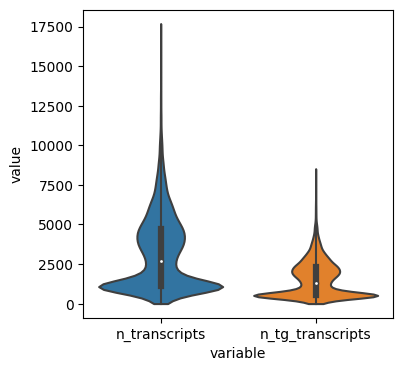

In [22]:
fig, ax = plt.subplots(figsize=(4,4))
sns.violinplot(data=tg_map_bin100.ad_sp.obs[['n_transcripts', 'n_tg_transcripts']].melt(), x='variable',
              y='value', cut=0, scale='width')

In [36]:
tg_map_bin50.ad_sc.obs.rename(columns={
    'class_label': 'class',
    'neighborhood_label': 'neighborhood',
    'subclass_label': 'subclass', 
    'cluster_label': 'cluster'
}, inplace=True)

tg_map_bin50.ad_sc.obs[['class', 'neighborhood', 'subclass', 'cluster']]

,class,neighborhood,subclass,cluster
sample_id,,,,
CATGCTCGTCCAGCGT-6LKTX_191204_01_F01,glia,glia,Micro-PVM,Micro-PVM_1
TAGCACACAGGCGTTC-11LKTX_191204_02_C01,glia,glia,Micro-PVM,Micro-PVM_1
GGCTTGGCATACACCA-1LKTX_191204_01_A01,glia,glia,Micro-PVM,Micro-PVM_1
TGTGAGTCAGACCTAT-10LKTX_191204_02_B01,glia,glia,Micro-PVM,Micro-PVM_1
AATTCCTCAATTGCTG-35L8TX_191126_02_H02,glia,glia,Micro-PVM,Micro-PVM_1
...,...,...,...,...
TGACAGTTCTGGGCGT-9LKTX_191204_02_A01,inh,lamp5_sncg_vip,Sncg,Sncg_7
GCTCAAACATCGATAC-5LKTX_191204_01_E01,inh,lamp5_sncg_vip,Sncg,Sncg_7
GCACGGTGTTGTTGCA-32L8TX_191126_01_G01,inh,lamp5_sncg_vip,Sncg,Sncg_7


In [38]:
human_labels = {}

for cls in ['exc', 'inh', 'glia']:
    neighborhoods = tg_map_bin50.ad_sc.obs[tg_map_bin50.ad_sc.obs['class'] == cls]['neighborhood'].unique().to_list()
    human_labels[cls] = {}
    for neighborhood in neighborhoods:
        subclasses = tg_map_bin50.ad_sc.obs[tg_map_bin50.ad_sc.obs['neighborhood'] == neighborhood]['subclass'].unique().to_list()
        human_labels[cls][neighborhood] = {}
        for subclass in subclasses:
            clusters = tg_map_bin50.ad_sc.obs[tg_map_bin50.ad_sc.obs['subclass']== subclass]['cluster'].unique().to_list()
            human_labels[cls][neighborhood][subclass] = clusters

subclasses = tg_map_bin50.ad_sc.obs['subclass'].unique().to_list()
human_labels['subclass'] = {sc: tg_map_bin50.ad_sc.obs[tg_map_bin50.ad_sc.obs['subclass']==sc]['subclass_color'].unique()[0] for sc in subclasses}
clusters = tg_map_bin50.ad_sc.obs['cluster'].unique().to_list()
human_labels['cluster'] = {cl: tg_map_bin50.ad_sc.obs[tg_map_bin50.ad_sc.obs['cluster']==cl]['cluster_color'].unique()[0] for cl in clusters}
tg_map_bin50.ordered_labels.update(human_labels)

In [39]:
tg_map_bin50.mapping(cluster_label='cluster')
tg_map_bin50.save_mapping(save_path=data_path + '/903TR_C4/mapping')

INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 4619 genes and rna_count_based density_prior in clusters mode...
INFO:root:Printing scores every 100 epochs.


Score: 0.174, KL reg: 0.153
Score: 0.222, KL reg: 0.000
Score: 0.226, KL reg: 0.000
Score: 0.227, KL reg: 0.000
Score: 0.227, KL reg: 0.000
Score: 0.228, KL reg: 0.000
Score: 0.228, KL reg: 0.000
Score: 0.228, KL reg: 0.000
Score: 0.228, KL reg: 0.000
Score: 0.228, KL reg: 0.000


INFO:root:Saving results..


analysis UID: 1677541944.367


INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.


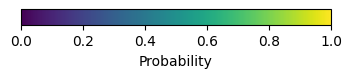

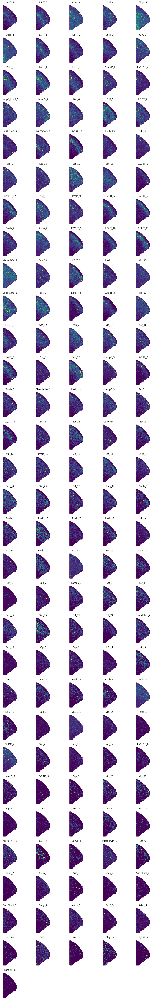

In [40]:
tg_map_bin50.plot_cell_probability()

           score  is_training  sparsity_sp  sparsity_sc  sparsity_diff
lamp5   0.559939         True     0.784447     0.864838      -0.080391
gfap    0.557488         True     0.262749     0.984158      -0.721408
rorb    0.539512         True     0.828212     0.720051       0.108162
pvalb   0.518346         True     0.926249     0.959127      -0.032878
grik1   0.472621         True     0.803453     0.416870       0.386583
cux2    0.472585         True     0.835762     0.639572       0.196189
opalin  0.466397         True     0.837451     0.966884      -0.129433
mog     0.334889         True     0.898532     0.946175      -0.047643
lhx6    0.312767         True     0.929627     0.773807       0.155820
fezf2   0.214610         True     0.984109     0.914327       0.069782


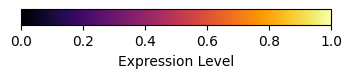

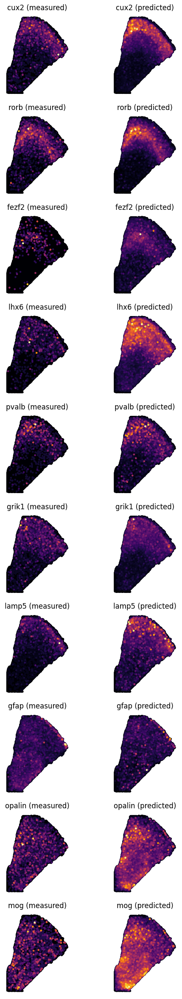

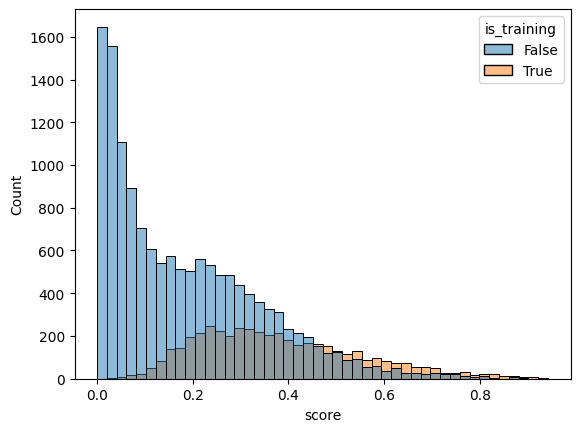

In [41]:
tg_map_bin50.compare_spatial_gene_exp()

<Figure size 640x480 with 0 Axes>

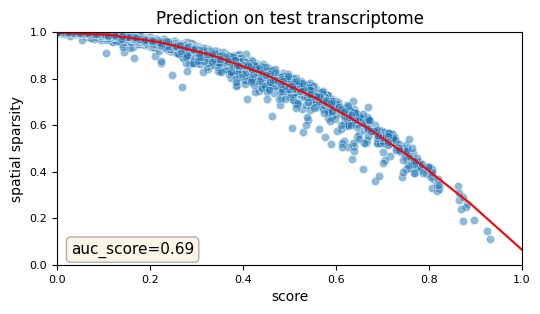

In [43]:
tg.plot_auc(tg_map_bin50.spatial_score)

In [41]:
tg_map_bin500.get_discrete_cell_mapping(threshold=0.1)

In [46]:
clusters = {}
for cls in ['exc', 'inh', 'glia']:
    for neighborhood, subclasses in tg_map_bin50.ordered_labels[cls].items():
        for subclass in subclasses:
            clusters[subclass] = [cl for cl in tg_map_bin50.ordered_labels[cls][neighborhood][subclass]]

subclasses = {}
for cls in ['exc', 'inh', 'glia']:
    for neighborhood in tg_map_bin50.ordered_labels[cls]:
        subclasses[neighborhood] = [subclass for subclass in tg_map_bin50.ordered_labels[cls][neighborhood]]
        
neighborhoods = {}
neighborhoods_subclass = {}
for cls in ['exc', 'inh', 'glia']:
    for neighborhood in tg_map_bin50.ordered_labels[cls]:
        neighborhoods[neighborhood] = [cl for clusters in tg_map_bin50.ordered_labels[cls][neighborhood].values() for cl in clusters]
        neighborhoods_subclass[neighborhood] = [subclasses for subclasses in tg_map_bin100.ordered_labels[cls][neighborhood].keys()]

# fig1 = tg_map_bin50.plot_discrete_mapping_probability(groups=neighborhoods)
fig2 = tg_map_bin100.plot_discrete_mapping(level='subclass', groups=neighborhoods_subclass)

NameError: name 'tg_map_bin100' is not defined

In [3]:
tg_map_deconv = TangramMapping(
    sp_data = data_path + '/903TR_C4/ad_sp_bin100.h5ad',
    sc_data = 'C://Users/stephanies/data/human/ad_sc_human_MTG_great_ape.h5ad',
    meta = {
        'stereoseq UID': '903TR_C4'
    }
)

In [6]:
tg_map_deconv.set_training_genes(training_genes, meta={'training_genes': 'cluster ROC marker genes above median'})

starting with 4620 training genes..


INFO:root:4620 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:18762 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.


In [189]:
# tg_map_deconv.mapping(
#     mode = 'constrained',
#     cluster_label = 'cluster_label', 
#     args = {
#         'target_count': tg_map_deconv.ad_sp.obs['n_cells'].sum(), # total number of cells,
#         'density_prior': np.array(tg_map_deconv.ad_sp.obs['n_cells'] / tg_map_deconv.ad_sp.obs['n_cells'].sum()), # fraction of cells / voxel
#     }
# )

tg_map_deconv.save_mapping(save_path=data_path + '/903TR_C4/mapping')

analysis UID: 1677521322.096


In [3]:
tg_map_deconv = TangramMapping.load_from_timestamp(directory=data_path + '/903TR_C4/mapping', timestamp='1677521322.096')

In [26]:
# tg.project_cell_annotations(tg_map_deconv.ad_map, tg_map_deconv.ad_sc, annotation='subclass_label')
annotation = tg_map_deconv.ad_sc.obs['subclass_label'].unique().to_list()
nrows = int(np.ceil(len(tg_map_deconv.ad_map.obs['subclass_label']) / 5))
tg.plot_cell_annotation_sc(tg_map_deconv.ad_sp, annotation)

ValueError: Spot Size and Scale Factor cannot be None when ad_sp.uns['spatial'] does not exist

In [73]:
# This is nominally what it wants in the adata_sp.uns['tangram_cell_segmentation'] space but it also wants some other things
# so format data below to run their tg.create_segment_cell_df
tg_cell_segment = None
binsize = 100
for r, row in tg_map_deconv.ad_sp.obs.iterrows():
    x_bounds = (row['x'], row['x']+binsize)
    y_bounds = (row['y'], row['y']+binsize)
    cells = cbg_meta[(cbg_meta['x'].between(x_bounds[0], x_bounds[1])) & (cbg_meta['y'].between(y_bounds[0], y_bounds[1]))].reset_index()
    for i, cell in cells.iterrows():
        cell_segment  = {'spot_idx': [row.name], 'x': [cell['x']], 'y': [cell['y']], 'centroid': [row.name + f'_{i}']}
        if tg_cell_segment is None:
            tg_cell_segment = pd.DataFrame(cell_segment)
        else:
            tg_cell_segment = tg_cell_segment.append(pd.DataFrame(cell_segment))
tg_cell_segment.reset_index(drop=True, inplace=True)
tg_cell_segment.head()

,spot_idx,x,y,centroid
0,bin:4511_4569,4570.000000,4592.000000,bin:4511_4569_0
1,bin:4511_4569,4600.666504,4597.333496,bin:4511_4569_1
2,bin:4511_4569,4582.363770,4663.454590,bin:4511_4569_2
3,bin:4511_4669,4587.222168,4717.333496,bin:4511_4669_0
4,bin:4511_4669,4595.411621,4750.411621,bin:4511_4669_1


In [74]:
# tg_map_deconv.ad_sp.uns['tangram_cell_segmentation'] = tg_cell_segment

In [113]:
def cell_centroids(row, binsize):
    x_bounds = (row['x'], row['x']+binsize)
    y_bounds = (row['y'], row['y']+binsize)
    cells = cbg_meta[(cbg_meta['x'].between(x_bounds[0], x_bounds[1])) & (cbg_meta['y'].between(y_bounds[0], y_bounds[1]))]
    centroids = [(c['y'], c['x']) for i, c in cells.iterrows()]
    return centroids

cell_count  = pd.DataFrame(tg_map_deconv.ad_sp.obs[['n_cells', 'x', 'y']])
cell_count.rename(columns={'n_cells': 'segmentation_label'}, inplace=True) # number of cells in each bin
cell_count['segmentation_centroid'] = cell_count.apply(lambda x: cell_centroids(x, 100), axis=1) # list of tuples of cell centriods in that bin

cell_count.drop(columns=['x', 'y'], inplace=True)
cell_count.head()

,segmentation_label,segmentation_centroid
bin:4511_4569,3,"[(4592.0, 4570.0), (4597.33349609375, 4600.666..."
bin:4511_4669,2,"[(4717.33349609375, 4587.22216796875), (4750.4..."
bin:4511_4769,0,[]
bin:4511_4869,1,"[(4876.7080078125, 4595.39306640625)]"
bin:4511_4969,3,"[(4982.6044921875, 4580.8603515625), (5049.420..."


In [114]:
tg_map_deconv.ad_sp.obsm['image_features'] = cell_count

In [115]:
tg.create_segment_cell_df(tg_map_deconv.ad_sp)

INFO:root:cell segmentation dataframe is saved in `uns` `tangram_cell_segmentation` of the spatial AnnData.
INFO:root:spot centroids is saved in `obsm` `tangram_spot_centroids` of the spatial AnnData.


In [116]:
tg_map_deconv.ad_sp.uns['tangram_cell_segmentation']

,spot_idx,y,x,centroids
0,bin:4511_4569,4592.000000,4570.000000,bin:4511_4569_0
1,bin:4511_4569,4597.333496,4600.666504,bin:4511_4569_1
2,bin:4511_4569,4663.454590,4582.363770,bin:4511_4569_2
3,bin:4511_4669,4717.333496,4587.222168,bin:4511_4669_0
4,bin:4511_4669,4750.411621,4595.411621,bin:4511_4669_1
...,...,...,...,...
50943,bin:20411_16369,16462.205078,20455.121094,bin:20411_16369_0
50944,bin:20411_16469,16534.880859,20444.818359,bin:20411_16469_0
50945,bin:20411_16569,NaN,NaN,NaN
50946,bin:20511_16069,NaN,NaN,NaN


In [117]:
tg_map_deconv.ad_sp.obsm['tangram_spot_centroids']

bin:4511_4569      [bin:4511_4569_0, bin:4511_4569_1, bin:4511_45...
bin:4511_4669                     [bin:4511_4669_0, bin:4511_4669_1]
bin:4511_4769                                                     []
bin:4511_4869                                      [bin:4511_4869_0]
bin:4511_4969      [bin:4511_4969_0, bin:4511_4969_1, bin:4511_49...
                                         ...                        
bin:20411_16369                                  [bin:20411_16369_0]
bin:20411_16469                                  [bin:20411_16469_0]
bin:20411_16569                                                   []
bin:20511_16069                                                   []
bin:20511_16169                                                   []
Name: centroids_idx, Length: 18942, dtype: object

In [125]:
tg_map_deconv.ad_sp.obsm['spatial'] = tg_map_deconv.ad_sp.obs[['y', 'x']].to_numpy()

In [8]:
tg.count_cell_annotations(
    tg_map_deconv.ad_map,
    tg_map_deconv.ad_sc,
    tg_map_deconv.ad_sp,
    annotation='cluster_label'
)
tg_map_deconv.ad_sp.obsm['tangram_ct_count'].head()

INFO:root:spatial cell count dataframe is saved in `obsm` `tangram_ct_count` of the spatial AnnData.


,x,y,cell_n,centroids,Micro-PVM_1,Micro-PVM_2,Micro-PVM_3,Endo_1,VLMC_1,VLMC_2,...,Lamp5_5,Lamp5_6,Sncg_2,Sncg_1,Sncg_8,Sncg_3,Sncg_4,Sncg_5,Sncg_6,Sncg_7
bin:4511_4569,4511.0,4569.0,3,"[bin:4511_4569_0, bin:4511_4569_1, bin:4511_45...",0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
bin:4511_4669,4511.0,4669.0,2,"[bin:4511_4669_0, bin:4511_4669_1]",0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
bin:4511_4769,4511.0,4769.0,0,[],0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
bin:4511_4869,4511.0,4869.0,1,[bin:4511_4869_0],0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
bin:4511_4969,4511.0,4969.0,3,"[bin:4511_4969_0, bin:4511_4969_1, bin:4511_49...",0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [7]:
tg_map_deconv.ad_sp.obsm['tangram_ct_count'].loc['bin:12911_19869']

x                                                       12911.0
y                                                       19869.0
cell_n                                                        5
centroids     [bin:12911_19869_0, bin:12911_19869_1, bin:129...
Micro-PVM                                                     0
Endo                                                          0
VLMC                                                          0
Oligo                                                         0
Astro                                                         0
OPC                                                           0
L5/6 NP                                                       0
L6 IT Car3                                                    1
L6 CT                                                         0
L6b                                                           0
L5 ET                                                         0
L2/3 IT                                 

In [177]:
tg_map_bin100 = TangramMapping.load_from_timestamp(directory=data_path + '/903TR_C4/mapping', timestamp='1676568816.650') 
tg_map_bin100.get_discrete_cell_mapping(threshold=0.1)

100

In [9]:
adata_segment_cluster = tg.deconvolve_cell_annotations(tg_map_deconv.ad_sp, filter_cell_annotation=tg_map_deconv.ad_sc.obs['cluster_label'].unique())
adata_segment_cluster.obs.head()

,y,x,centroids,cluster
0,4592.000000,4570.000000,bin:4511_4569_0,L2/3 IT_5
1,4876.708008,4595.393066,bin:4511_4869_0,L2/3 IT_12
2,4982.604492,4580.860352,bin:4511_4969_0,L2/3 IT_3
3,5118.043457,4577.304199,bin:4511_5069_0,L2/3 IT_13
4,5399.405273,4586.243164,bin:4511_5369_0,L2/3 IT_5


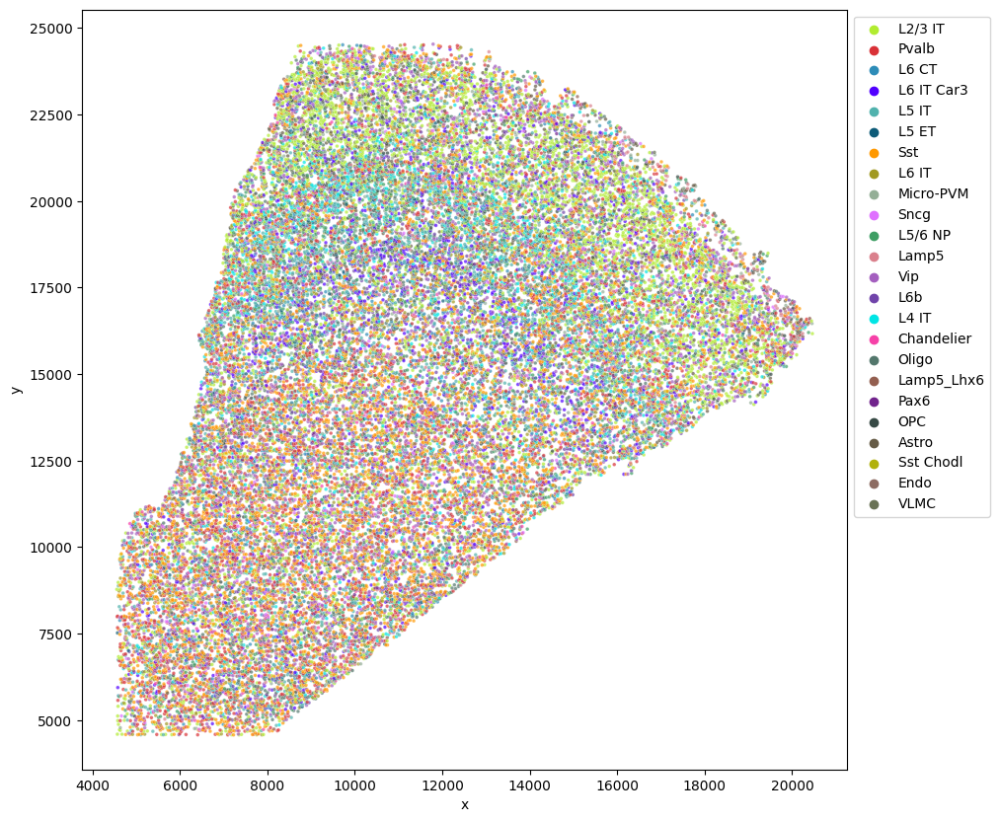

In [153]:
fig, ax = plt.subplots(figsize=(10,10))
sns.scatterplot(data=adata_segment.obs, x='x', y='y', hue='cluster', palette=tg_map_deconv.ordered_labels['subclass'], ax=ax,
               s=7, alpha=0.7)
ax.legend(bbox_to_anchor=(1,1))

In [155]:
tg_map_cells = TangramMapping.load_from_timestamp(directory=data_path + '/903TR_C4/mapping', timestamp='1675737007.572')
print(tg_map_cells.meta)

{'stereoseq UID': '903TR_C4', 'training_genes': 'cluster ROC marker genes above median + SEA AD gene panel', 'mode': 'clusters', 'cluster_label': 'cluster'}


In [157]:
tg_map_cells.get_discrete_cell_mapping(threshold=0.1)

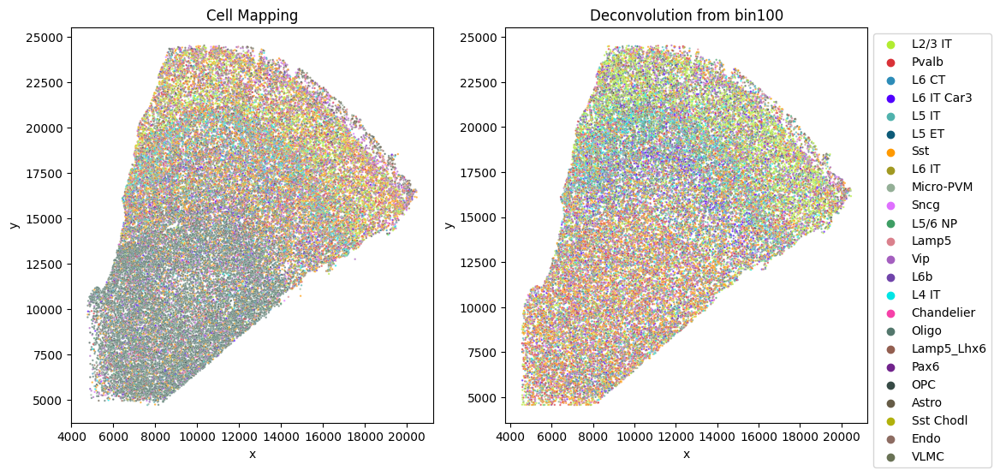

In [159]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

sns.scatterplot(data=tg_map_cells.ad_sp.obsm['discrete_ct_pred'], x='x', y='y', hue='subclass', 
                palette=tg_map_cells.ordered_labels['subclass'], legend=None, ax=ax[0],s=3, alpha=0.7)
ax[0].set_title('Cell Mapping')
sns.scatterplot(data=adata_segment.obs, x='x', y='y', hue='cluster', palette=tg_map_deconv.ordered_labels['subclass'], ax=ax[1],
               s=3, alpha=0.7)
ax[1].set_title('Deconvolution from bin100')
ax[1].legend(bbox_to_anchor=(1,1))

In [160]:
neighborhoods = {}
neighborhoods_subclass = {}
for cls in ['exc', 'inh', 'glia']:
    for neighborhood in tg_map_cells.ordered_labels[cls]:
        neighborhoods[neighborhood] = [cl for clusters in tg_map_cells.ordered_labels[cls][neighborhood].values() for cl in clusters]
        neighborhoods_subclass[neighborhood] = [subclasses for subclasses in tg_map_cells.ordered_labels[cls][neighborhood].keys()]

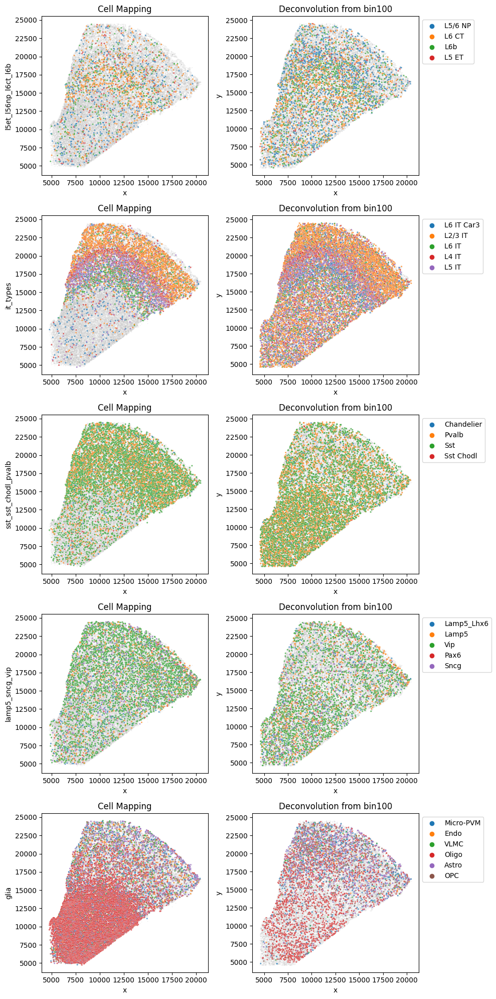

In [166]:
data1 = tg_map_cells.ad_sp.obsm['discrete_ct_pred']
data2 = adata_segment.obs
groups = neighborhoods_subclass
fig, ax = plt.subplots(len(groups), 2, figsize=(10, len(groups)*4))
for i, (group_name, group) in enumerate(groups.items()):
    sns.scatterplot(data=data1, x='x', y='y', ax=ax[i, 0], color='grey', s=2, alpha=0.1, lw=0)
    sns.scatterplot(data=data2, x='x', y='y', ax=ax[i, 1], color='grey', s=2, alpha=0.1, lw=0)
    subdata1 = data1[data1['subclass'].isin(group)]
    subdata2 = data2[data2['cluster'].isin(group)]
    sns.scatterplot(data=subdata1, x='x', y='y', hue='subclass', ax=ax[i, 0], hue_order=group, s=5, alpha=0.7, legend=False)
    sns.scatterplot(data=subdata2, x='x', y='y', hue='cluster', ax=ax[i, 1], hue_order=group, s=5, alpha=0.7)
    ax[i, 0].set_ylabel(group_name)
    ax[i, 0].set_title('Cell Mapping')
    ax[i, 1].set_title('Deconvolution from bin100')
    ax[i, 1].legend(bbox_to_anchor=(1,1))

plt.tight_layout()
